In [ ]:
import zipfile
import os

# Path to the zip file
zip_path = "bookcover_pics.zip"

# Path to the directory where the extracted files will be saved
extracted_files_dir = "covers"

# Create the directory if it doesn't already exist
if not os.path.exists(extracted_files_dir):
    os.makedirs(extracted_files_dir)

# Open the zip file
with zipfile.ZipFile(zip_path, "r") as zip_ref:
    
    # Extract all the files in the zip file
    zip_ref.extractall(extracted_files_dir)

# Print a message indicating that the extraction is complete
print("Extraction complete.")


Extraction complete.


In [ ]:
import numpy as np
import os
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.preprocessing import image
# Load the VGG16 model with pre-trained weights
model = VGG16(weights='imagenet', include_top=False)

# Load the dataset of images
dataset_path = 'covers'
dataset = []
for filename in os.listdir(dataset_path):
    img = image.load_img(os.path.join(dataset_path, filename), target_size=(224, 224))
    img = preprocess_input(image.img_to_array(img))
    feat = model.predict(np.expand_dims(img, axis=0)).flatten()
    dataset.append((feat, filename))

# Extract features from the query image
query_image_path = 'query.jpg'
query_image = image.load_img(query_image_path, target_size=(224, 224))
query_image = preprocess_input(image.img_to_array(query_image))
query_feat = model.predict(np.expand_dims(query_image, axis=0)).flatten()

# Calculate the cosine similarity between the query image and each image in the dataset
similarity_scores = []
for feat, filename in dataset:
    similarity_score = cosine_similarity([query_feat], [feat])[0][0]
    similarity_scores.append((filename, similarity_score))

# Sort the similarity scores in descending order and select the top 10 images
similarity_scores.sort(key=lambda x: x[1], reverse=True)
top_10_images = [filename for filename, score in similarity_scores[:10]]

# Return the file paths or indices of the top 10 matching images
print('Top 10 matching images:', top_10_images)


1/1 [==============================] - 1s 564ms/step
Top 10 matching images: ['IMG_20170506_130323.jpg', 'IMG_20170506_130429.jpg', 'IMG_20170506_130333.jpg', 'IMG_20170506_130352.jpg', 'IMG_20170506_130410.jpg', 'IMG_20170506_130343.jpg', 'IMG_20170506_131150.jpg', 'IMG_20170309_155855.jpg', 'IMG_20170506_131140.jpg', 'IMG_20170506_130902.jpg']


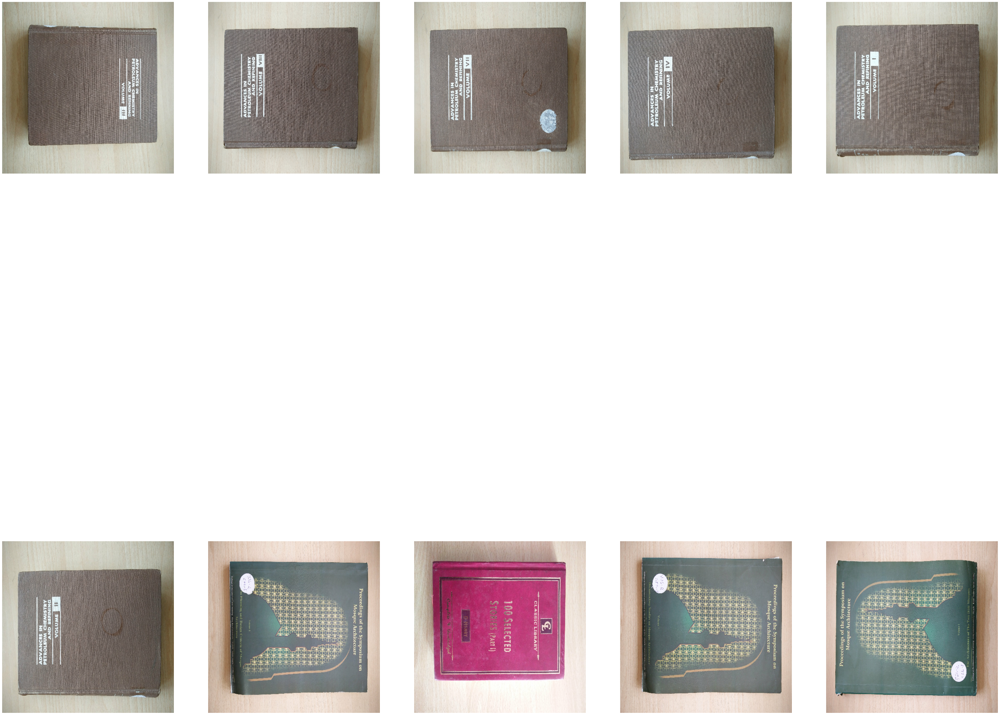

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(60, 60))
columns = 5
rows = 2
for i, filename in enumerate(top_10_images):
    img = image.load_img(os.path.join(dataset_path, filename), target_size=(448, 448))
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()